In [1]:
import cafe

output_dir = "./output/26.03.16-case_gastrulation"
img_dir = "./img/26.03.16-case_gastrulation"

INFO                                                                                                                                                                                                    
             ██████╗ █████╗ ███████╗███████╗                                                                                                                                                            
           ██╔════╝██╔══██╗██╔════╝██╔════╝                                                                                                                                                             
           ██║     ███████║█████╗  █████╗                                                                                                                                                               
           ██║     ██╔══██║██╔══╝  ██╔══╝                                                                                                                                                           

In [2]:
# sub_filename = "output/26.02.02-gastrulation_case_data/gastrulation_subsampled.h5ad"
sub_filename = "output/26.02.02-gastrulation_case_data/gastrulation.h5ad"
fadata = cafe.data.read_h5ad(sub_filename)

basis = "X_stavia"
basis = "umap"

fadata

AnnData object with n_obs × n_vars = 89267 × 53801
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'cell_velocyto_loom', 'celltype_coarse', 'celltype_new', 'pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'cafe', 'celltype_coarse_colors', 'celltype_colors', 'celltype_new_colors', 'id'
    obsm: 'X_pca', 'X_stavia', 'X_umap'
    layers: 'spliced', 'unspliced'

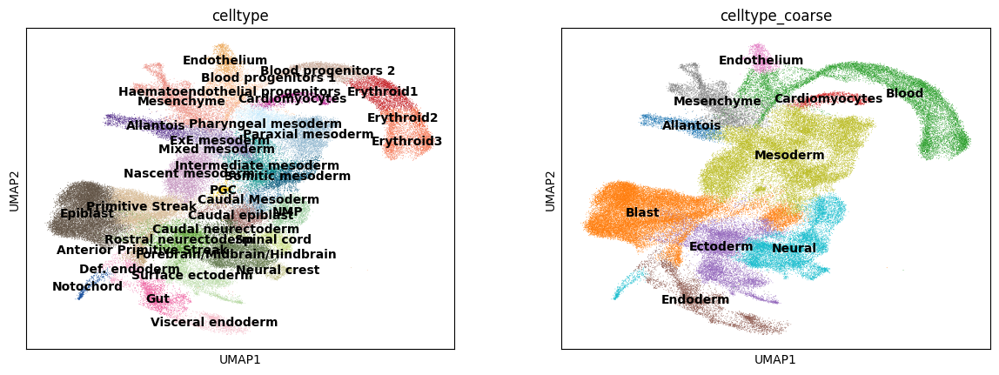

In [3]:
import scanpy as sc

# color_list = ["celltype", "celltype_coarse", "celltype_new"] # 细粒度，粗粒度
color_list = ["celltype", "celltype_coarse"] # 细粒度，粗粒度
sc.pl.embedding(fadata, basis=basis, color=color_list, frameon="None", legend_loc="on data", save=f"embedding_{basis}.pdf")
# 手动移动
# TODO: embedding metric

## 展示不同了粒度的细胞比例关系

热图

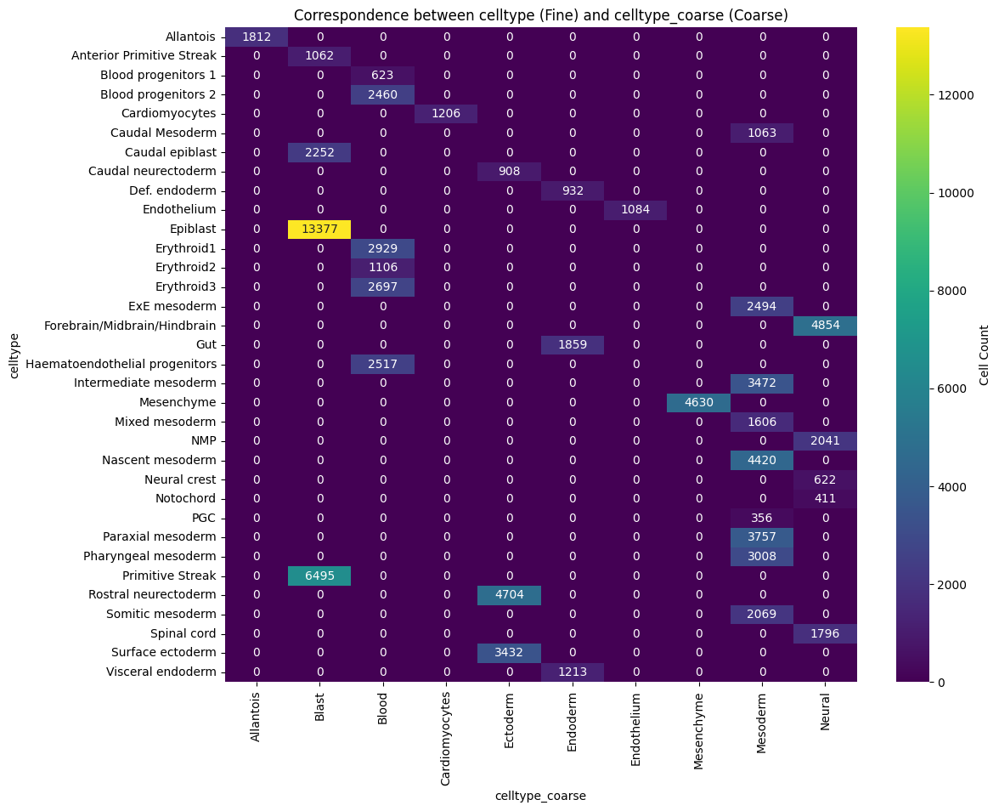

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 统计不同粒度下的细胞数量关系
fine_key = "celltype"         # 细粒度
coarse_key = "celltype_coarse" # 粗粒度

# 创建交叉表（混淆矩阵）
confusion_matrix = pd.crosstab(fadata.obs[fine_key], fadata.obs[coarse_key])

# 简单归一化（可选：按行或列归一化，这里直接展示数量或log数量会更直观，或者用比例）
# confusion_matrix_norm = confusion_matrix.div(confusion_matrix.sum(axis=1), axis=0) # 按行归一化

plt.figure(figsize=(12, 10))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="viridis", cbar_kws={'label': 'Cell Count'})
# sns.heatmap(confusion_matrix_norm, annot=True, fmt=".2f", cmap="viridis", cbar_kws={'label': 'Proportion'})

plt.title(f"Correspondence between {fine_key} (Fine) and {coarse_key} (Coarse)")
plt.xlabel(coarse_key)
plt.ylabel(fine_key)
plt.show()

桑基图

In [5]:
import plotly.graph_objects as go
from matplotlib.colors import to_hex, to_rgba


def plot_sankey(adata, source_col, target_col, title="Sankey Diagram"):
    """
    绘制桑基图，支持 Scanpy 颜色配置
    """
    # 提取数据
    df = adata.obs[[source_col, target_col]].copy()

    # 获取颜色映射辅助函数
    def get_color_map(col):
        # 尝试从 adata.uns 中获取 Scanpy 风格的颜色
        # Scanpy 通常存储在 "key_colors" 中
        uns_key = f"{col}_colors"
        if uns_key in adata.uns and hasattr(adata.obs[col], "cat"):
            categories = adata.obs[col].cat.categories
            colors = adata.uns[uns_key]
            # 确保长度一致
            if len(categories) == len(colors):
                return dict(zip(categories, colors))
        return {}

    source_color_map = get_color_map(source_col)
    target_color_map = get_color_map(target_col)

    # 统计源和目标的流向数量
    # 这里的关键是：分别处理 Source 和 Target 的节点，即使名字一样也视为不同节点（分层）
    sankey_df = df.groupby([source_col, target_col]).size().reset_index(name="count")
    sankey_df = sankey_df[sankey_df["count"] > 0]

    # 获取唯一的 Source 和 Target 标签列表（保持出现顺序或字母顺序，这里用 unique 保持顺序）
    source_labels_unique = list(sankey_df[source_col].unique())
    target_labels_unique = list(sankey_df[target_col].unique())

    # 构建所有节点列表：先 Source 后 Target
    all_labels = source_labels_unique + target_labels_unique

    # 为节点分配颜色
    node_colors = []
    for label in source_labels_unique:
        node_colors.append(source_color_map.get(label, "grey"))
    for label in target_labels_unique:
        node_colors.append(target_color_map.get(label, "grey"))

    # 构建索引映射
    # Source 节点索引范围: 0 ~ len(source)-1
    source_map = {label: i for i, label in enumerate(source_labels_unique)}
    # Target 节点索引范围: len(source) ~ len(source)+len(target)-1
    target_start_idx = len(source_labels_unique)
    target_map = {label: i + target_start_idx for i, label in enumerate(target_labels_unique)}

    # 映射 Source 和 Target 到对应的索引
    source_indices = sankey_df[source_col].map(source_map)
    target_indices = sankey_df[target_col].map(target_map)

    # 设置 Link 颜色
    # 通常让 Link 颜色跟随 Source 颜色，但增加透明度
    def hex_to_rgba_str(color, alpha=0.3):
        try:
            r, g, b, a = to_rgba(color)  # matplotlib handles hex, names etc
            return f"rgba({r*255:.0f}, {g*255:.0f}, {b*255:.0f}, {alpha})"
        except:
            return "rgba(128, 128, 128, 0.3)"

    link_colors = [hex_to_rgba_str(node_colors[src_idx]) for src_idx in source_indices]

    # 创建桑基图
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=all_labels,  # 显示的标签是原始名称
            color=node_colors  # 节点颜色
        ),
        link=dict(
            source=source_indices,
            target=target_indices,
            value=sankey_df["count"],
            color=link_colors  # 连接颜色
        )
    )])

    fig.update_layout(
        title_text=title,
        font=dict(family="Arial", size=12, color="black"),
        width=800,
        height=600
    )
    fig.write_image(f"{img_dir}/cluster_coarse2fine.pdf")
    fig.write_image(f"{img_dir}/cluster_coarse2fine.svg")
    fig.show()


# 绘制桑基图
# 这里的 source_col 和 target_col 分别对应想要放在左边和右边的列
plot_sankey(fadata, source_col=coarse_key, target_col=fine_key, title="Mapping from Coarse to Fine Cell Types")

## 拆分轨迹分别运行轨迹（分治思想）

array([[<Axes: title={'center': 'ref_coarse_projection(celltype_coarse)'}, xlabel='_milestone_network_emb1', ylabel='_milestone_network_emb2'>]],
      dtype=object)

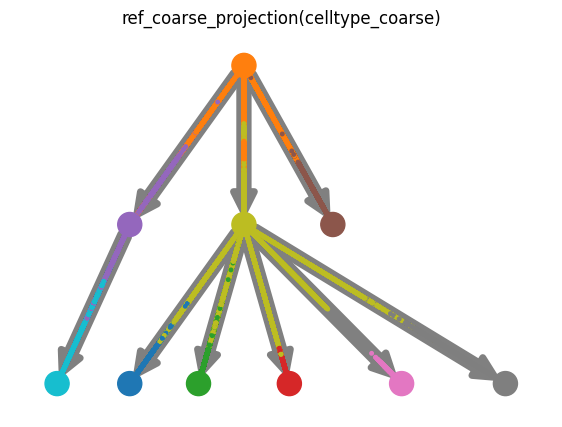

In [6]:
# for adobe illustrator
nx_draw_kwargs = {"with_labels": False}
sc_pl_embedding_kwargs = {"size": 50, "legend_loc": None}
cafe.plot.plot_graph(fadata,
                     color="celltype_coarse",
                     nx_draw_kwargs=nx_draw_kwargs,
                     save=f"{img_dir}/full_graph_ai.pdf",
                     **sc_pl_embedding_kwargs
                    )

array([[<Axes: title={'center': 'ref_coarse_projection(celltype_coarse)'}, xlabel='X_umap1', ylabel='X_umap2'>]],
      dtype=object)

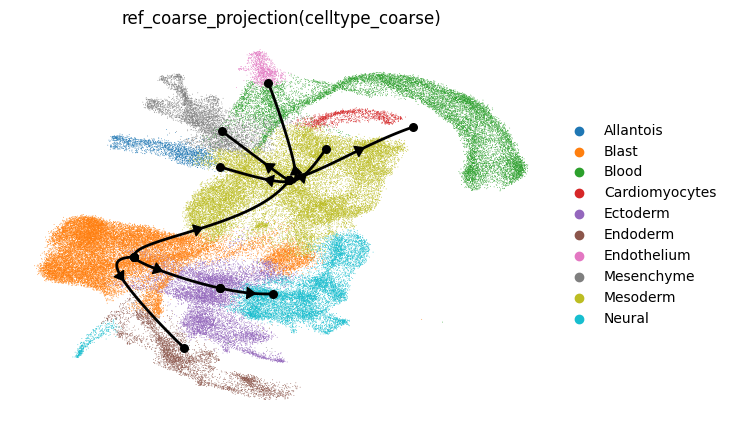

In [8]:
cafe.plot.plot_trajectory(fadata, color="celltype_coarse", save=f"{img_dir}/full_trajectory_ai.pdf",)

WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           


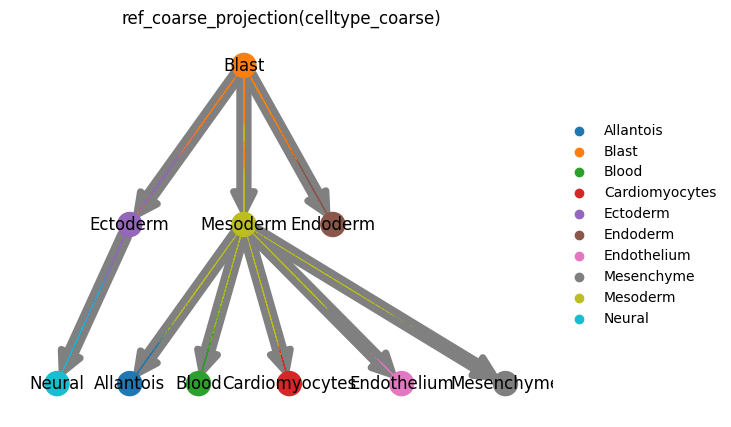

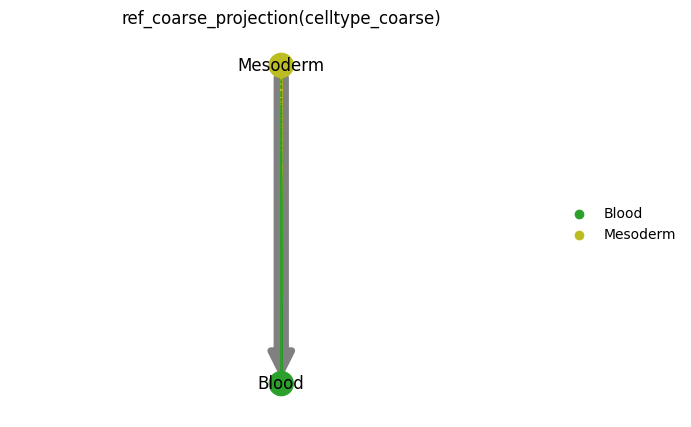

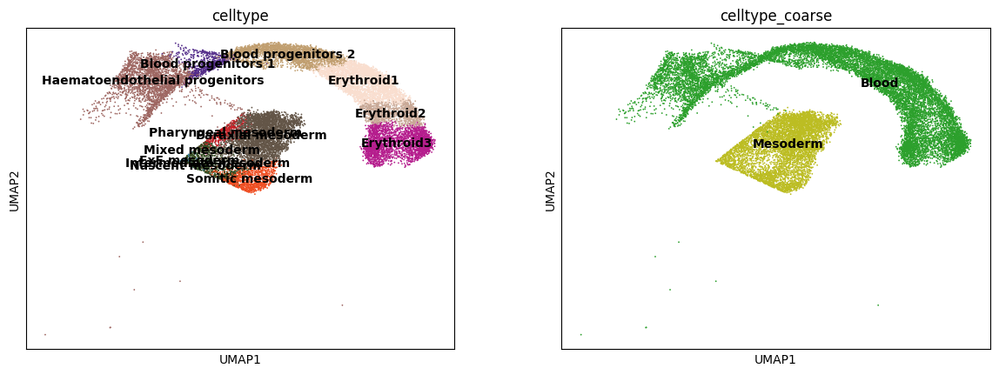

AnnData object with n_obs × n_vars = 18254 × 53801
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'cell_velocyto_loom', 'celltype_coarse', 'celltype_new', 'pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'cafe', 'celltype_coarse_colors', 'celltype_colors', 'celltype_new_colors', 'id'
    obsm: 'X_pca', 'X_stavia', 'X_umap'
    layers: 'spliced', 'unspliced'

In [7]:
fadata.model_name = "ref_coarse_projection"
edge_list = [
    ("Mesoderm", "Blood")
]
fadata_sub = fadata.subset_trajectory(edge_list, keep_color_cluster="celltype_coarse")  # TODO: subset后细胞color需要保持一致
# 对比前后
cafe.plot.plot_graph(fadata, color="celltype_coarse", save=f"{img_dir}/full_graph.pdf")
cafe.plot.plot_graph(fadata_sub, color="celltype_coarse", save=f"{img_dir}/subset_graph.pdf")
sc.pl.embedding(fadata_sub, basis=basis, color=color_list, frameon="None", legend_loc="on data")


fadata_sub

## 重要基因

WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
Filtered out 33495 genes that are detected 3 counts (spliced).
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                        

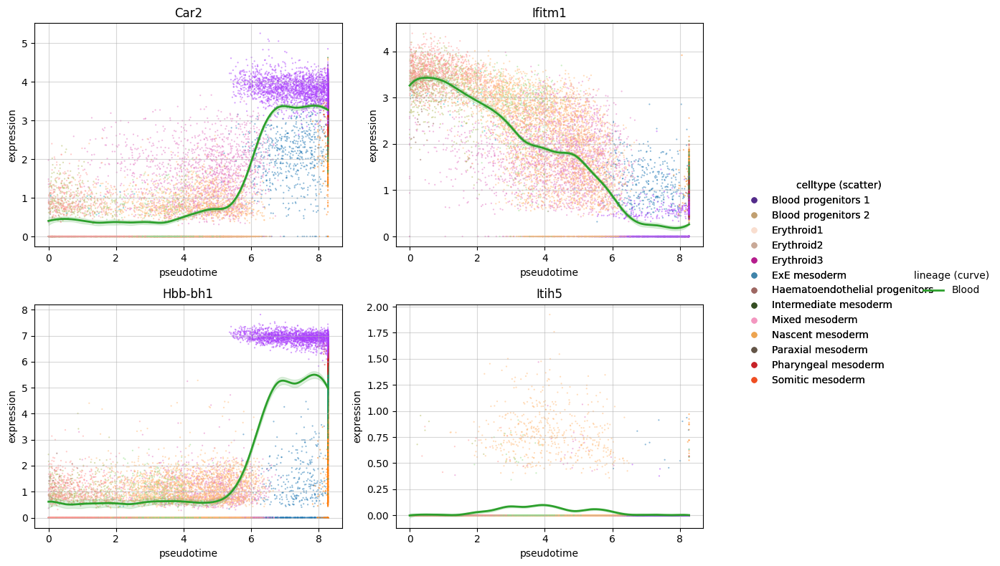

WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                       

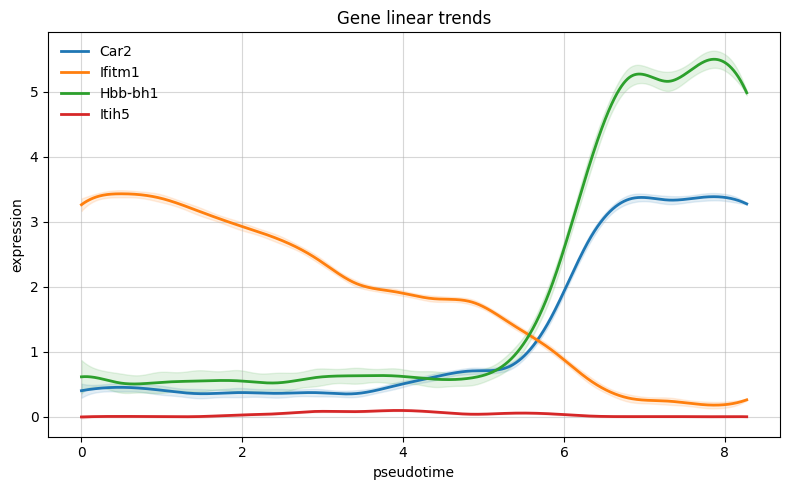

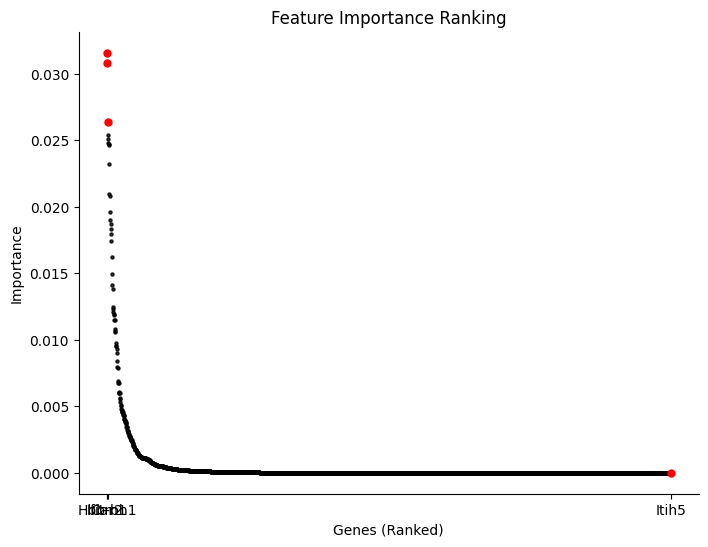

WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           
WARNING  |- Both milestone_percentages and progressions are given, will only use progressions                                                                                                           


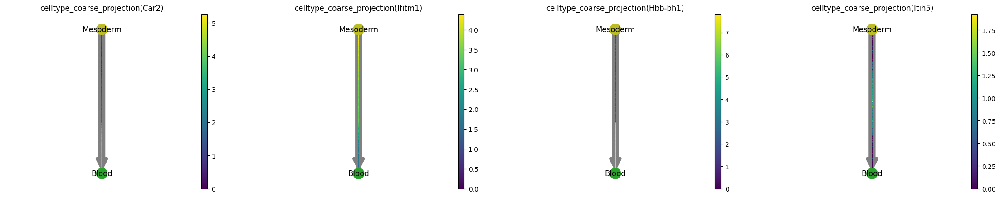

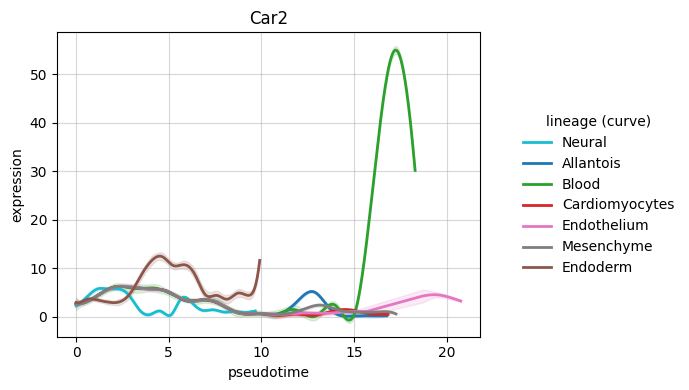

,feature_id,importance,gene
0,1133,0.031582,Car2
1,1670,0.030844,Ifitm1
2,1577,0.026399,Hbb-bh1
3,1238,0.025361,Smim1
4,915,0.025122,Fth1
...,...,...,...
1995,774,0.000000,Pdzph1
1996,773,0.000000,Tubb4a
1997,771,0.000000,Rftn1
1998,770,0.000000,Apobec2


In [8]:
import scvelo as scv
from cafe.metric.metric_featureimp import calculate_overall_feature_importance, plot_featureimp

# scvelo 预处理
scv.pp.filter_and_normalize(fadata_sub, min_counts=3, min_counts_u=3, n_top_genes=2000)

# 重要基因计算
featureimp_df = calculate_overall_feature_importance(fadata_sub)
featureimp_df["gene"] = fadata_sub.var_names[featureimp_df["feature_id"]]

# fadata_sub上显著（前三个）特征基因+最后一个特征基因（不显著）的趋势图
genes = featureimp_df["gene"].tolist()
genes = genes[:3] + [genes[-1]]
cafe.plot.plot_gene_trends(fadata_sub, genes=genes, start_milestone="Mesoderm", show_cell=True, n_cols=2, curve_mode="pygam", save=f"{img_dir}/coarse_blood_feature_importance_trends.pdf") 
cafe.plot.plot_gene_linear_trends(fadata_sub, genes=genes, start_milestone="Mesoderm", show_cell=True, n_cols=2, curve_mode="pygam", save=f"{img_dir}/linear_trends.pdf") 

# 绘制重要性排名图
plot_featureimp(featureimp_df, gene_list=genes, save=f"{img_dir}/coarse_blood_feature_importance_ranking.pdf")
cafe.plot.plot_graph(fadata_sub, color=genes, model_name="celltype_coarse_projection")

# fadata上排名第一的特征基因的趋势图
top_gene = featureimp_df.loc[0, "gene"]
cafe.plot.plot_gene_trends(fadata, genes=[top_gene], start_milestone="Blast", curve_mode="pygam", save=f"{img_dir}/coarse_feature_importance_trends.pdf")

featureimp_df.to_csv(f"{output_dir}/feature_importance.csv", index=False)
featureimp_df

In [9]:
# fadata_sub.id = "gatrulation_blood_lineage"
# fadata_sub.check_result_dir()
# fadata_sub.write_h5ad(f"{fadata_sub.h5ad_dir}/fadata_sub.h5ad")

拆分，方便后续的细聚类轨迹推断

In [10]:
# coarse_cluster_list = ["Neural", "Blood"] # 叶子节点
# coarse_cluster_list = ["Blast", "Mesoderm", "Ectoderm", "Endoderm"] # 非叶子节点
# for cluster in coarse_cluster_list:
#     fadata_sub = fadata[fadata.obs["celltype_coarse"] == cluster]
#     new_id = f"gastrulation_{cluster.lower()}"
#     fadata_sub.id = new_id
#     fadata_sub.check_result_dir()
#     fadata_sub.write_h5ad(f"{fadata_sub.h5ad_dir}/{new_id}.h5ad")
#     print(new_id)
#     print(fadata_sub)